In [1]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader 
from torch.autograd import Variable
from torch.backends import cudnn


import matplotlib.pyplot as plt
import os
from PIL import Image
import cv2
import numpy as np


# Augmenting library 

import torchvision
import torchvision.transforms.functional as TF
import albumentations as A
import torchvision.transforms as T

# Control Randomness
import random
random_seed = 7
torch.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(random_seed)
random.seed(random_seed)

import warnings
warnings.filterwarnings("ignore")
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "2, 3"
print(torch.cuda.device_count())


# logging
import datetime
from tensorboardX import SummaryWriter
from tqdm import tqdm
import time 

/home/sklab2/anaconda3/envs/vessel2/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


2


In [2]:
import joint_transforms
from config import cod_training_root
from config import backbone_path
from datasets import ImageFolder
from misc import AvgMeter, check_mkdir
from PFNet import PFNet
from helper import *
import loss

# Config

In [3]:
ckpt_path = './ckpt'
exp_name = 'PFNet'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
args = {
    'epoch_num': 300,
    'train_batch_size': 32,
    'last_epoch': 0,
    'lr': 1e-4, 
    'lr_decay': 0.9,
    'weight_decay': 5e-4,
    'momentum': 0.9,
    'snapshot': '',
    'scale': 416, 
    'save_point': [],
    'poly_train': False,
    'optimizer': 'Adam',
    'amp' : False
}

In [4]:
def dice_loss(pred, target, smooth = 1.):
    pred = pred.contiguous()
    target = target.contiguous()
    intersection = (pred * target).sum(dim=2).sum(dim=2)
    loss = (1 -   ( (2. * intersection + smooth) / (pred.sum(dim=2).sum(dim=2) + target.sum(dim=2).sum(dim=2) + smooth))  )
    return loss.mean()


def soft_dice_loss(inputs, targets):
        num = targets.size(0)
        m1  = inputs.view(num,-1)
        m2  = targets.view(num,-1)
        intersection = (m1 * m2)
        score = 2. * (intersection.sum(1)+1) / (m1.sum(1) + m2.sum(1)+1)
        score = 1 - score.sum()/num
        return score

# Net

In [5]:
from SA_Unet import SA_UNet

net = SA_UNet(in_channels=3, num_classes=1 , base_c=16).to(device)
optimizer = torch.optim.Adam(net.parameters(), lr=args['lr'])
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=40, verbose=True)

## making data index list

In [6]:
mask_files = os.walk("/home/sklab2/workspace/datashared/SS-OCT/vessel_segmentation/masked")
mask_idx = []
for (root, dirs, files) in mask_files:
    if len(files) > 0 :
        mask_idx.append(files)

mask_idxs = [element for array in mask_idx for element in array]
len(mask_idxs)

1691

In [7]:
# 1~ 11 / 12, 13, 14  , 40, 41, 43, 44, 46, 49,  50, 53, 54, 55 
train_indexs = []
test_indexs = []
for idx, data in enumerate(mask_idxs):
    tmp = mask_idxs[idx].split('_')
    if len(tmp) < 3:
        if int(tmp[0]) < 45:
            train_indexs.append([ tmp[0], tmp[1].split('.')[0]])
        else:
            test_indexs.append([tmp[0], tmp[1].split('.')[0]])

In [8]:
len(train_indexs) , len(test_indexs)

(1319, 355)

# Dataloader

In [9]:
import albumentations.augmentations.functional as AF

PATH = '/home/sklab2/workspace/datashared/SS-OCT/vessel_segmentation/'
class VesselDataset(Dataset):
    def __init__(self, index, transforms):
        self.index = index
        self.transforms = transforms
        
    def __len__(self):
        return len(self.index)
        
    def __getitem__(self, idx):
        s_1 = self.index[idx][0]
        s_2 = self.index[idx][1]

        # '1_L_0.jpg', 
        # image = Image.open(PATH+'origin/' + s_1+'_L_'+s_2+'.jpg').convert("L").resize((416, 416),Image.Resampling.BILINEAR)
        image = Image.open(PATH+'origin/' + s_1+'_L_'+s_2+'.jpg').resize((416, 416),Image.Resampling.BILINEAR)
        #'10_L_112_L.png', 
        mask = Image.open(PATH+'masked/' +  s_1+'_'+s_2+'.png').resize((416, 416),Image.Resampling.BILINEAR)
        
        image = np.array(image, dtype=np.uint8) #RGB
        mask = np.array(mask, dtype=np.uint8)   # HWC
        mask_o = mask / 255        # CHW

        lower_red = np.array([-10, 100, 100]) 
        upper_red = np.array([10, 255, 255])

        lower_yellow = np.array([22, 93, 0]) 
        upper_yellow = np.array([45, 255, 255]) 

        mask_hsv = cv2.cvtColor(mask, cv2.COLOR_RGB2HSV)

        mask_r = cv2.inRange(mask_hsv, lower_red, upper_red)
        mask_y = cv2.inRange(mask_hsv, lower_yellow, upper_yellow)
        mask_y = 255 - mask_y # 색반전
        mask_r, mask_y = mask_r/255, mask_y/255

        mask_r = np.expand_dims(mask_r,axis=0)
        mask_y = np.expand_dims(mask_y,axis=0)
        mask = np.concatenate([mask_r, mask_y], axis=0)
        
        # aft_mask = cv2.resize(aft_mask, (416, 416), interpolation=cv2.INTER_NEAREST)
        # masks = [mask_r, mask_y, mask_o]  # target, original
        masks = [mask, mask_o]

        # for num in range(3): #### 3번 이터레이션이 왜들어갔지?
        if self.transforms:
            transformed = self.transforms(image=image, masks=masks)
            image, masks = transformed['image'], transformed['masks']
        # urls.append(s_1+'_'+s_2)
        # assert sum(masks[0]==0).sum() + sum(masks[0]==1).sum() == 416*416   # mask가 0 또는 1이 아닐경우 스탑
                    
        return image, masks, s_1+'_'+s_2

In [10]:
import albumentations.pytorch as AP

train_transform = A.Compose([
    # A.RandomRotate90(p=0.25),
    # A.HorizontalFlip(p=0.25),
    # A.OneOf([
    #     A.OpticalDistortion(p=1, distort_limit=0.1, interpolation=cv2.INTER_NEAREST),
    #     A.GridDistortion(p=1, interpolation=cv2.INTER_NEAREST),
    #     A.ElasticTransform(p=1, interpolation=cv2.INTER_NEAREST),
    #     ], p = 0.5),
    # A.RandomBrightnessContrast(p=0.25),    # 밝기 및 조도 변화
    # A.Normalize(mean=(126.71482973095203, 126.6879562017254, 126.85466873988524), std = (32.9434, 33.0122, 32.9186)),
    AP.ToTensorV2(always_apply=True)
])

test_transform = A.Compose([
    AP.ToTensorV2(always_apply=True)
])

train_dataset = VesselDataset(index=train_indexs, transforms=train_transform)
test_dataset = VesselDataset(index=test_indexs, transforms=test_transform)
 
#train_dataset, _, test_dataset = torch.utils.data.random_split(dataset, [train, 0, test])

train_loader = DataLoader(dataset=train_dataset, batch_size=args['train_batch_size'], shuffle=True)
test_loader = DataLoader(dataset=test_dataset, batch_size=1, shuffle=False)

image, [mask, mask_o],  _= next(iter(train_loader))
print(image.shape, mask.shape, mask_o.shape)

torch.Size([32, 3, 416, 416]) torch.Size([32, 2, 416, 416]) torch.Size([32, 416, 416, 3])


In [11]:
from sklearn.metrics import jaccard_score, precision_score, recall_score
def calc_metric(labels, preds):
    accuracy = np.mean(np.equal(labels,preds))
    right = np.sum(labels *preds == 1)
    precision = right / np.sum(preds)
    recall = right / np.sum(labels)
    f1 = 2 * precision*recall/(precision+recall)

    
    y_pred = preds
    y_true = labels
    """ Ground truth """
    #y_true = y_true.cpu().numpy()
    y_true = y_true > 0.5
    y_true = y_true.astype(np.uint8)
    y_true = y_true.reshape(-1)

    """ Prediction """
    #y_pred = y_pred.cpu().numpy()
    y_pred = y_pred > 0.5
    y_pred = y_pred.astype(np.uint8)
    y_pred = y_pred.reshape(-1)

    score_jaccard = jaccard_score(y_true, y_pred)

    print('jaccard, f1, recall, precision, acc')
    print(score_jaccard, f1, recall, precision, accuracy)
    return score_jaccard, f1, recall, precision, accuracy

# Train

Using 2 GPUs.
SA-UNet_2lb_base_b32_e300_js_221002_12:16
../model/vessel_SA-UNet_2lb_base_b32_e300_221002_12:16.pt
Training 300 epochs.


100%|██████████| 42/42 [01:07<00:00,  1.60s/it, Epoch=0, Loss=0.862726, Mean Loss=0.894331, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.21728611065243814 0.3570008870568278 0.8042827968226975 0.22941656184352513 0.7366588980071256
Model Saved


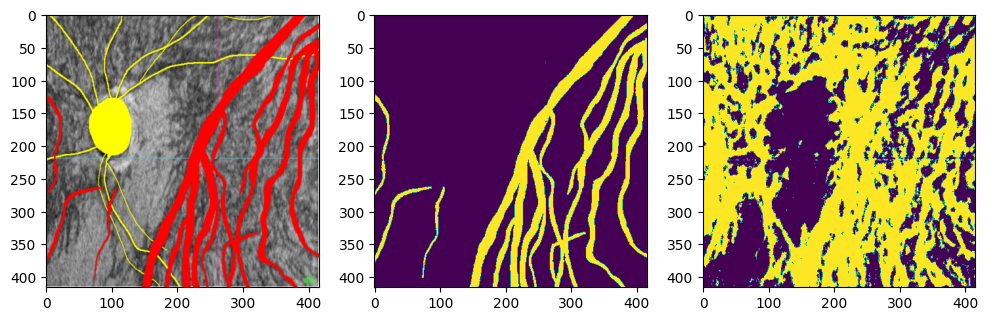

100%|██████████| 42/42 [01:06<00:00,  1.59s/it, Epoch=5, Loss=0.796967, Mean Loss=0.819368, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.2730484740302761 0.42896791379176097 0.8863970754147306 0.2829502012625966 0.785497277767939
Model Saved


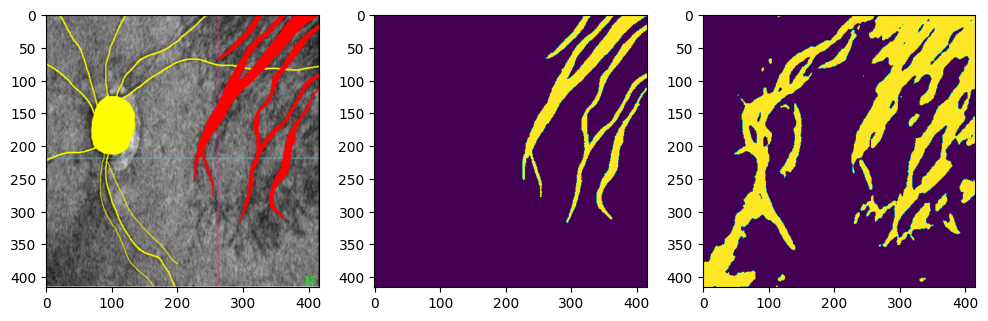

100%|██████████| 42/42 [01:06<00:00,  1.59s/it, Epoch=10, Loss=0.782009, Mean Loss=0.796110, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.31526904374154413 0.47939856144519105 0.8517526881643407 0.3335730252036247 0.831852296285107
Model Saved


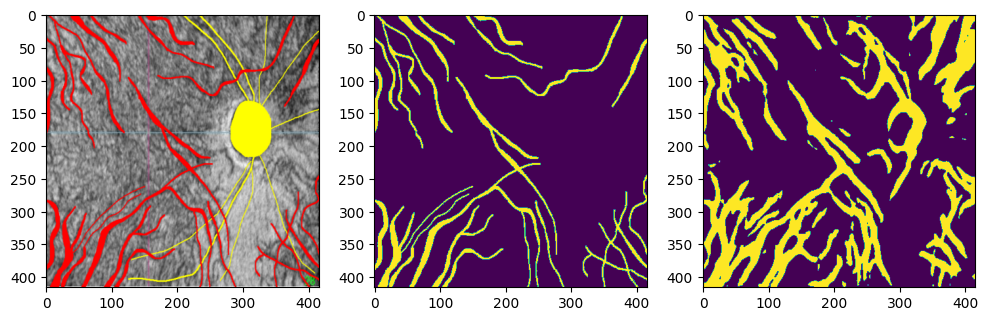

100%|██████████| 42/42 [01:06<00:00,  1.59s/it, Epoch=15, Loss=0.821233, Mean Loss=0.774862, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.33893547330422635 0.5062760380346053 0.8288183179838212 0.36444781507431706 0.8530650991749312
Model Saved


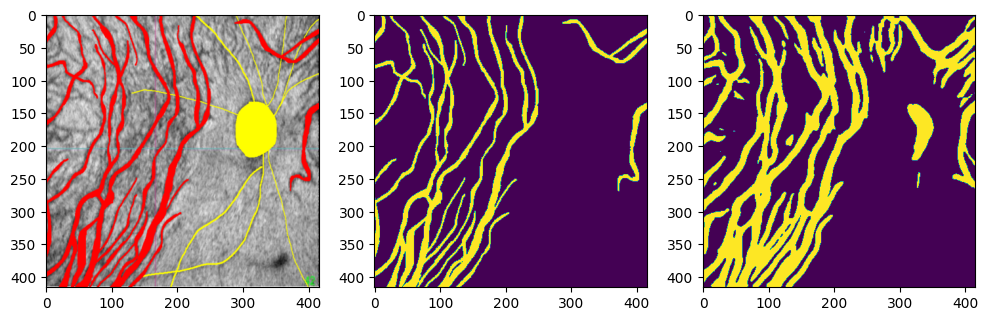

100%|██████████| 42/42 [01:06<00:00,  1.58s/it, Epoch=20, Loss=0.725494, Mean Loss=0.751137, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.3408615113079727 0.5084216504588485 0.8220089940953864 0.3680244076030585 0.8555178914649137
Model Saved


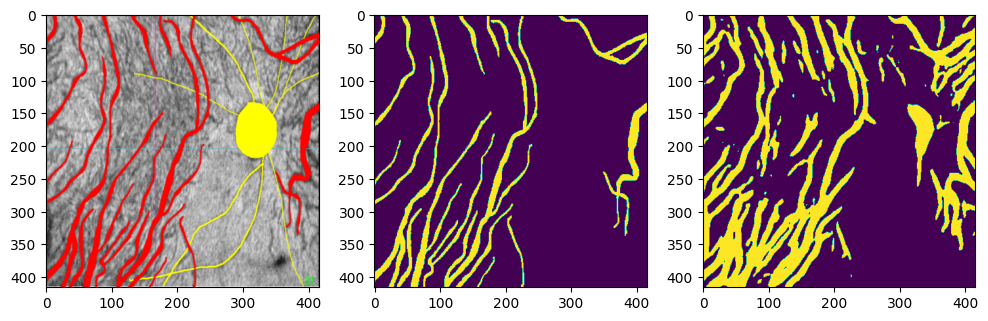

100%|██████████| 42/42 [01:06<00:00,  1.59s/it, Epoch=25, Loss=0.700266, Mean Loss=0.727633, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.3110677574715131 0.4745258293460428 0.8859656725836964 0.32404178217845125 0.8216483209538294


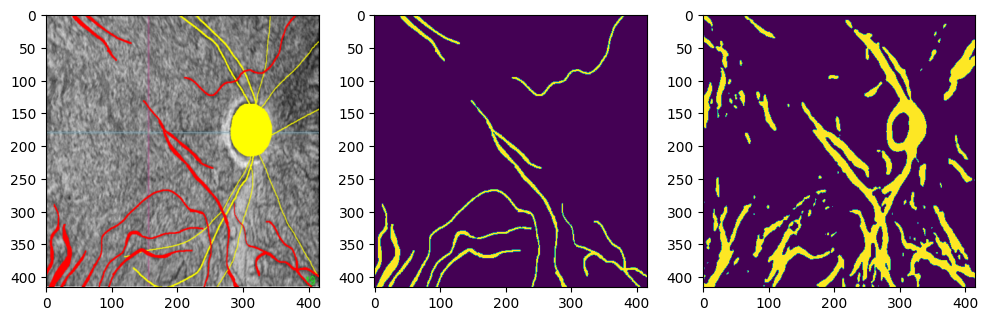

100%|██████████| 42/42 [01:07<00:00,  1.61s/it, Epoch=30, Loss=0.721734, Mean Loss=0.704268, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.31136890759912367 0.4748761478098228 0.8112706631032208 0.33568421746820604 0.8369142741061755


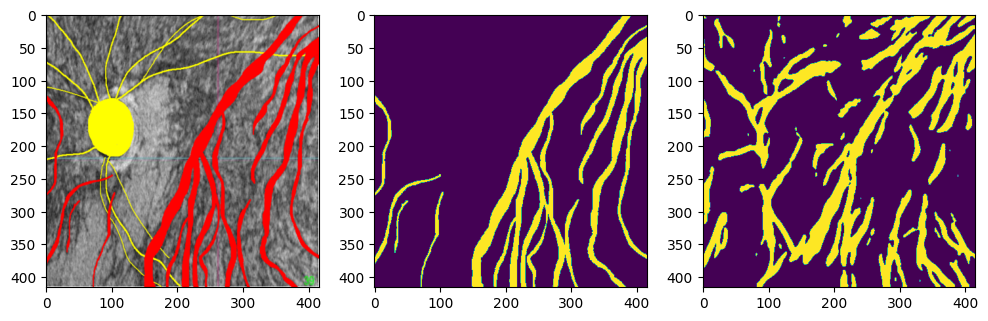

100%|██████████| 42/42 [01:07<00:00,  1.61s/it, Epoch=35, Loss=0.694861, Mean Loss=0.679963, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.3532660147159488 0.5220939724701495 0.7972096886378272 0.38814558656111176 0.8673414679087841
Model Saved


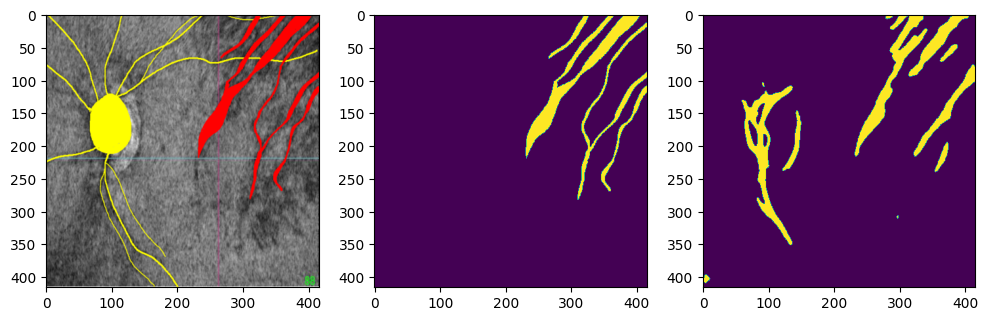

100%|██████████| 42/42 [01:06<00:00,  1.59s/it, Epoch=40, Loss=0.670433, Mean Loss=0.657537, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.27683423554463166 0.4336259599532879 0.8734834641450344 0.2883981500423939 0.792598667076423


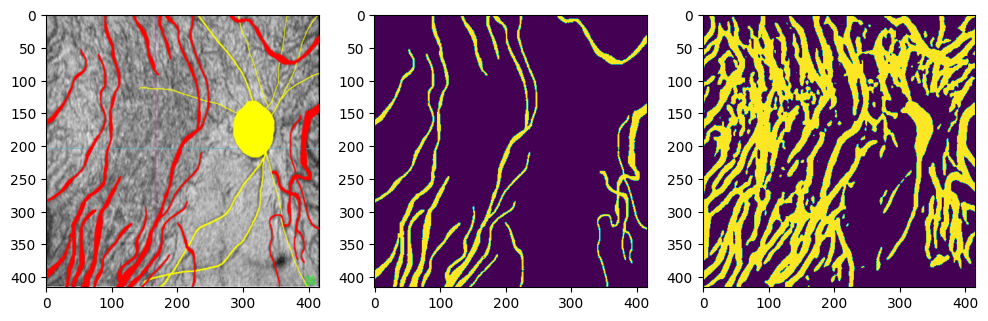

100%|██████████| 42/42 [01:06<00:00,  1.58s/it, Epoch=45, Loss=0.753496, Mean Loss=0.639817, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.3274764385285031 0.4933819223059177 0.8242365656251635 0.3520617402625754 0.8461426961361364


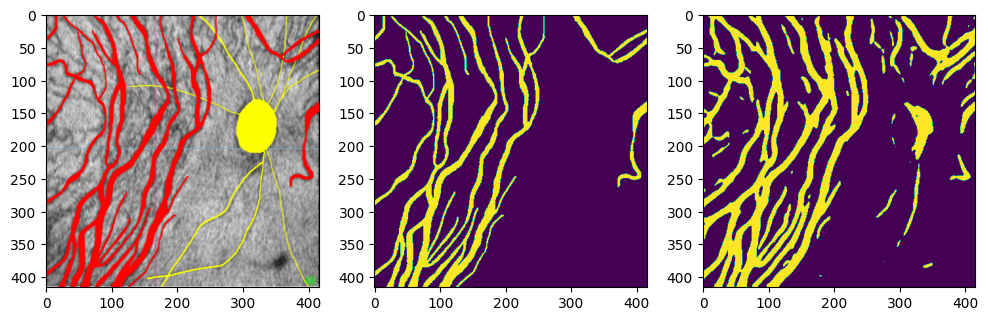

100%|██████████| 42/42 [01:07<00:00,  1.61s/it, Epoch=50, Loss=0.534658, Mean Loss=0.614448, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.3254344097082497 0.49106075310038655 0.8528733684950219 0.34479087121044294 0.8393117720747563


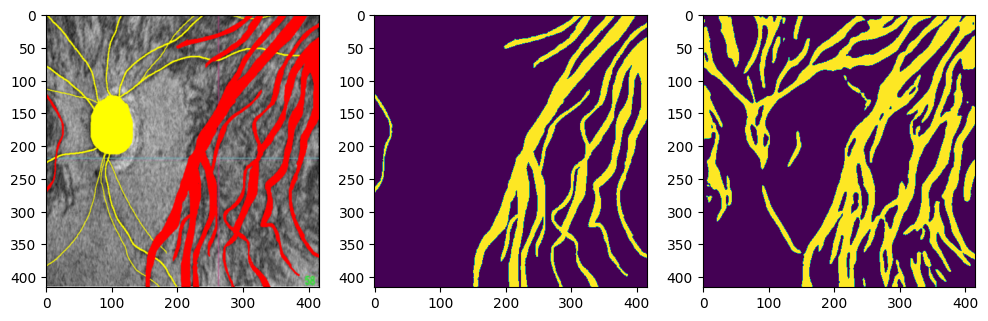

100%|██████████| 42/42 [01:05<00:00,  1.56s/it, Epoch=55, Loss=0.625787, Mean Loss=0.594561, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.3549545969412433 0.5239357801988928 0.8250451101590442 0.38384668930906796 0.8637194212798983
Model Saved


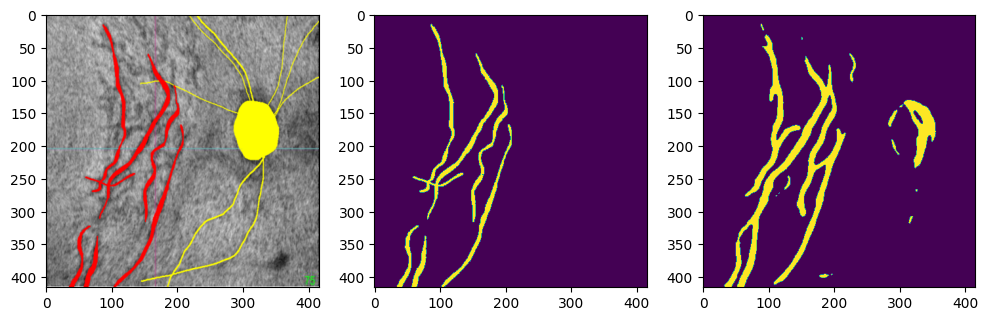

100%|██████████| 42/42 [01:07<00:00,  1.60s/it, Epoch=60, Loss=0.545092, Mean Loss=0.573261, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.35872521474268143 0.5280320271536547 0.8292002948367044 0.38734650548226074 0.865264976508459
Model Saved


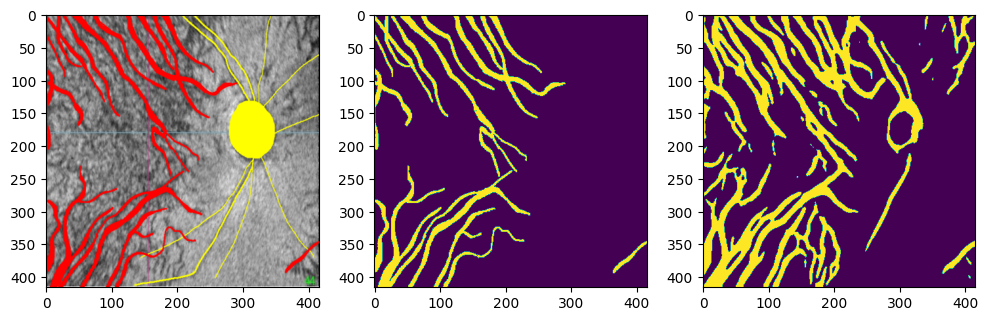

100%|██████████| 42/42 [01:06<00:00,  1.59s/it, Epoch=65, Loss=0.527698, Mean Loss=0.556425, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.37517051156574893 0.5456348989603992 0.8005552543038208 0.4138521831312345 0.8788110760532127
Model Saved


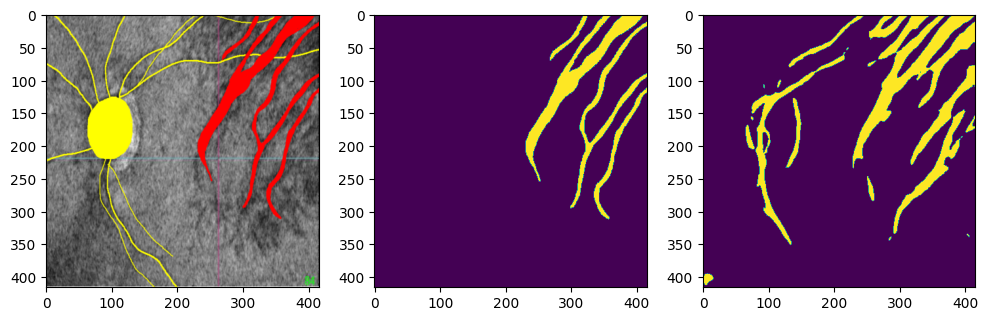

100%|██████████| 42/42 [01:04<00:00,  1.54s/it, Epoch=70, Loss=0.547578, Mean Loss=0.541468, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.3928487468876329 0.5640939086393502 0.776269728307547 0.44300773684111555 0.8909506781815151
Model Saved


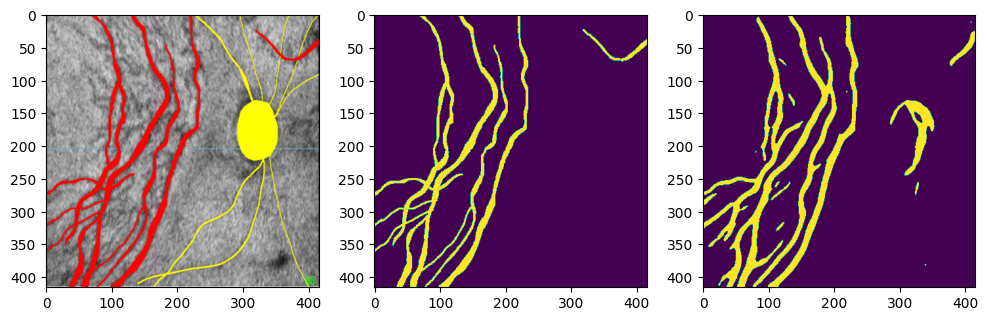

100%|██████████| 42/42 [01:06<00:00,  1.59s/it, Epoch=75, Loss=0.545184, Mean Loss=0.528253, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.38750906825780984 0.5585679792988677 0.7798869577737393 0.4350951850299953 0.8879560926952246


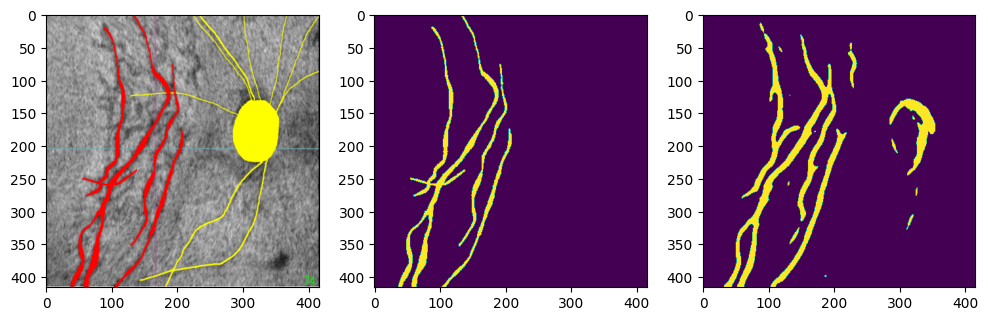

100%|██████████| 42/42 [01:08<00:00,  1.62s/it, Epoch=80, Loss=0.494299, Mean Loss=0.519549, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.3955003787349684 0.5668223165850984 0.6860349047690338 0.48290730164636786 0.9046909508084007
Model Saved


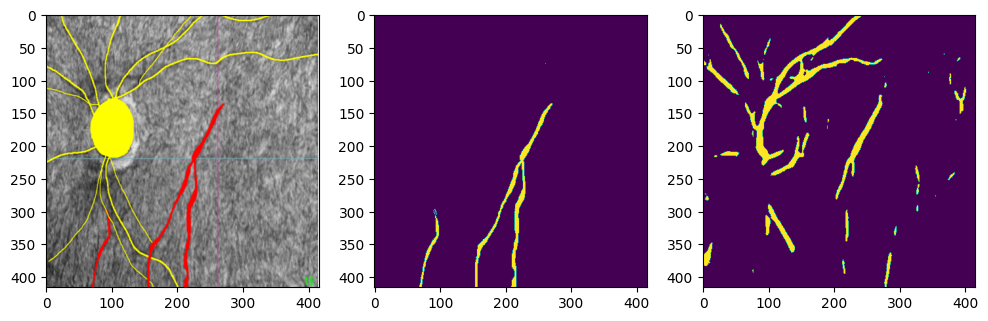

100%|██████████| 42/42 [01:03<00:00,  1.52s/it, Epoch=85, Loss=0.541626, Mean Loss=0.510220, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.3976203051091236 0.5689961767950675 0.7381506589772261 0.46291471722523825 0.8983551038107342
Model Saved


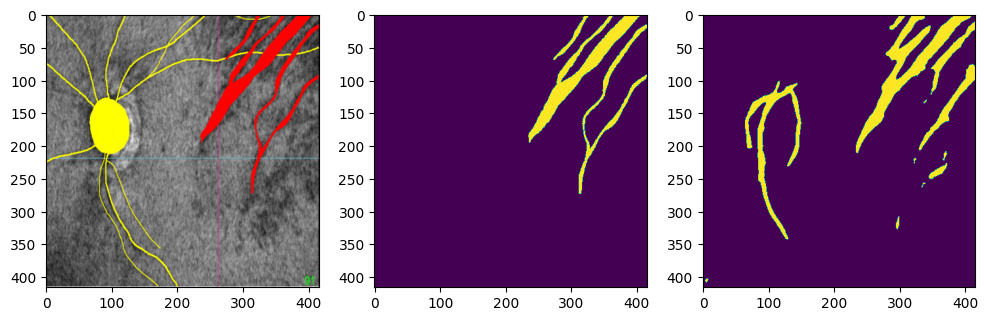

100%|██████████| 42/42 [01:06<00:00,  1.59s/it, Epoch=90, Loss=0.586294, Mean Loss=0.504893, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.40711776240035025 0.5786548550220318 0.693628418361536 0.49637703214849727 0.9081849105915076
Model Saved


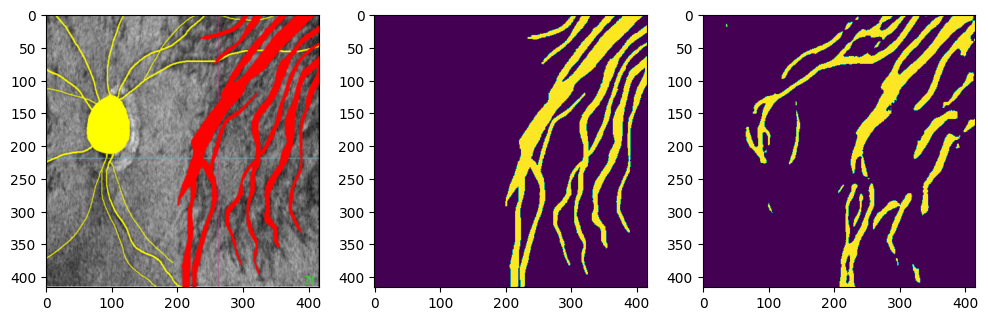

100%|██████████| 42/42 [01:07<00:00,  1.60s/it, Epoch=95, Loss=0.521967, Mean Loss=0.495128, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.3987582691367097 0.5701603742908583 0.7499965974870113 0.4598873380549052 0.8972131629458705


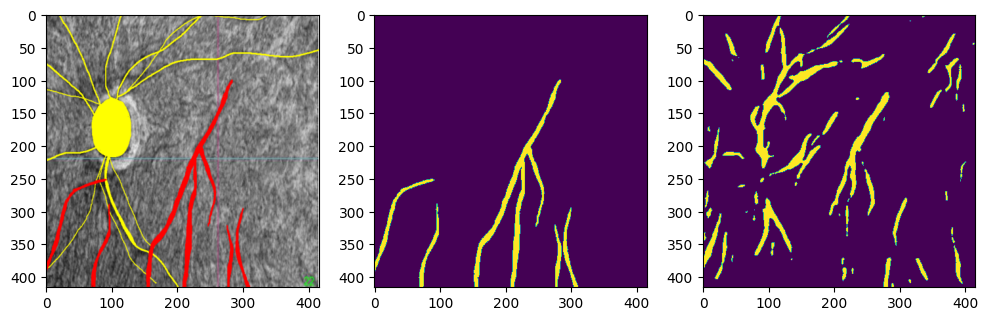

100%|██████████| 42/42 [01:03<00:00,  1.50s/it, Epoch=100, Loss=0.527540, Mean Loss=0.490728, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.40702801032434416 0.5785641896788071 0.6952458655885595 0.4954190371587758 0.9079365826058422


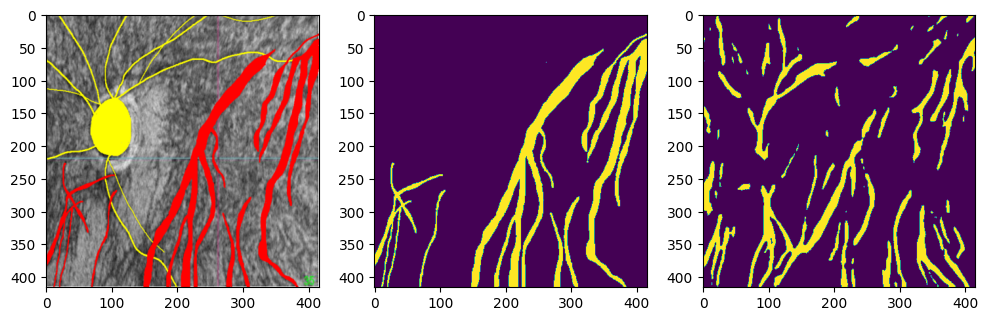

100%|██████████| 42/42 [01:07<00:00,  1.62s/it, Epoch=105, Loss=0.469275, Mean Loss=0.483795, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.4119912039347954 0.5835605813785519 0.699572250393438 0.5005527689315671 0.9092456923493625
Model Saved


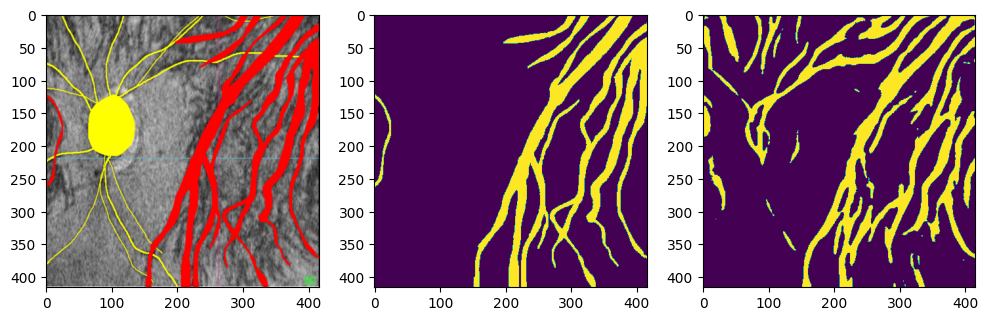

100%|██████████| 42/42 [01:09<00:00,  1.64s/it, Epoch=110, Loss=0.497081, Mean Loss=0.480121, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.4092679730751039 0.5808234926137682 0.6966767118401005 0.49800774780388857 0.9085986006646387


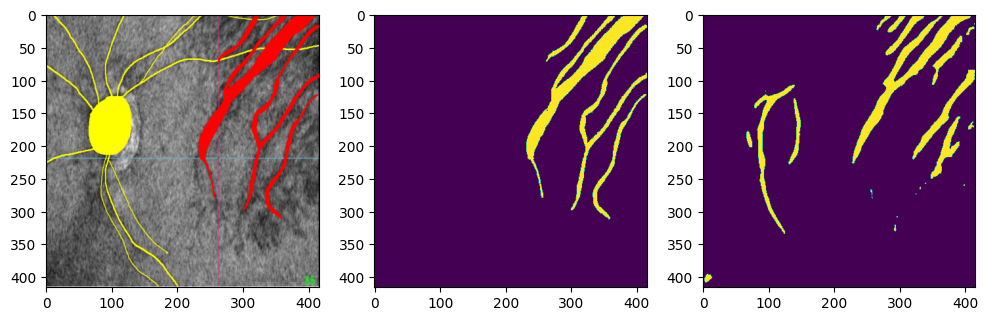

100%|██████████| 42/42 [01:04<00:00,  1.53s/it, Epoch=115, Loss=0.487317, Mean Loss=0.476084, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.4135693799685679 0.5851419616598712 0.7043773150519295 0.5004302867959461 0.9092153512792732
Model Saved


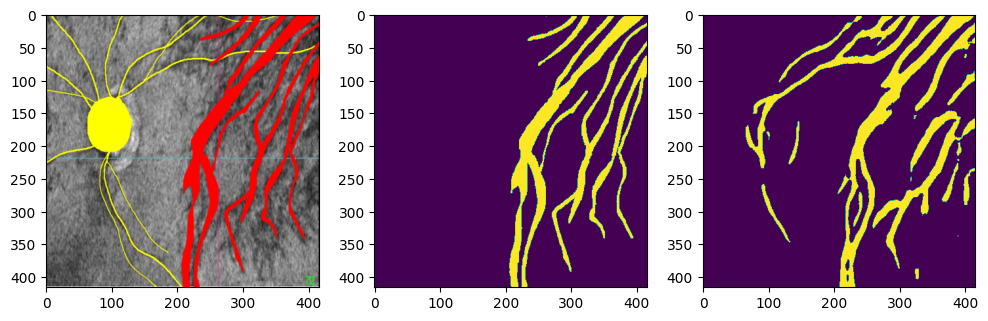

100%|██████████| 42/42 [01:07<00:00,  1.61s/it, Epoch=120, Loss=0.496388, Mean Loss=0.472444, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.40098613073440786 0.5724341189933235 0.7097608069184909 0.4796332193280262 0.9036263438619885


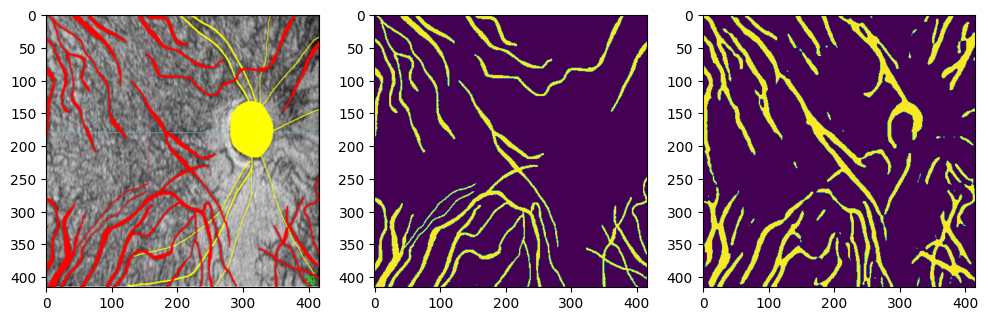

100%|██████████| 42/42 [01:07<00:00,  1.62s/it, Epoch=125, Loss=0.458778, Mean Loss=0.468837, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.41349923785725917 0.5850717521207691 0.6831273678804206 0.5116324016494419 0.9119287121583048


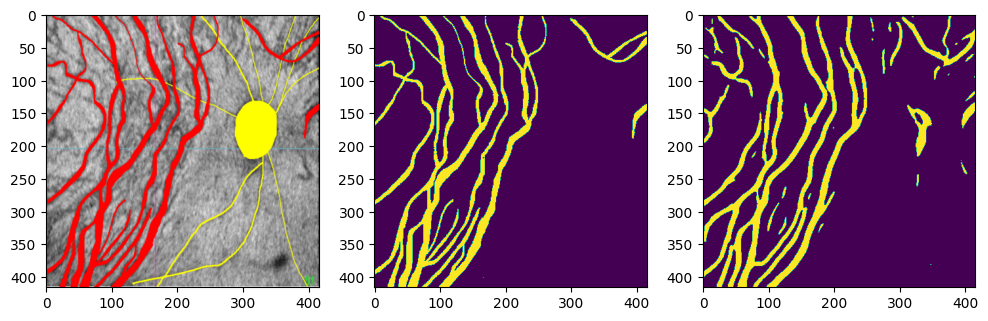

100%|██████████| 42/42 [01:07<00:00,  1.61s/it, Epoch=130, Loss=0.403138, Mean Loss=0.464494, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.4175520401860153 0.5891170529883657 0.6926655071857493 0.5125017672273696 0.9121768773699892
Model Saved


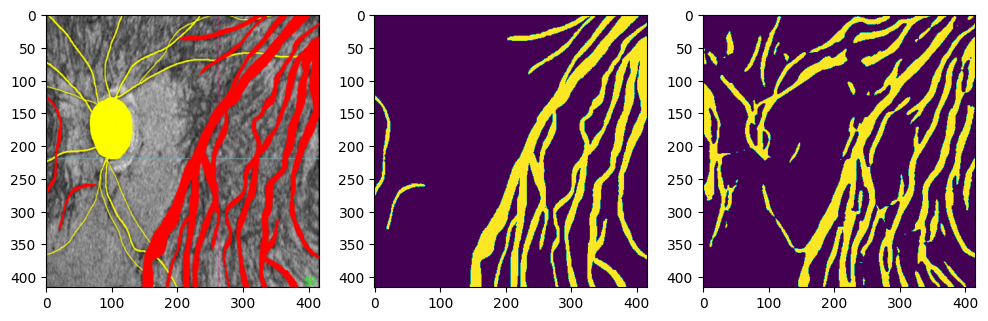

100%|██████████| 42/42 [01:07<00:00,  1.61s/it, Epoch=135, Loss=0.532347, Mean Loss=0.464071, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.41374052557089447 0.5853132425468505 0.6681043776373953 0.5207786343189567 0.9139511788742812


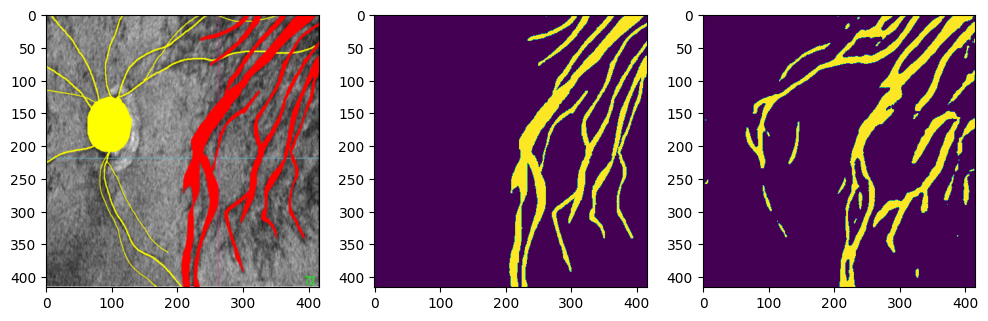

100%|██████████| 42/42 [01:07<00:00,  1.61s/it, Epoch=140, Loss=0.394971, Mean Loss=0.459703, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.41456777774316433 0.586140564299543 0.6958851798711629 0.5062952417160707 0.910678201048004


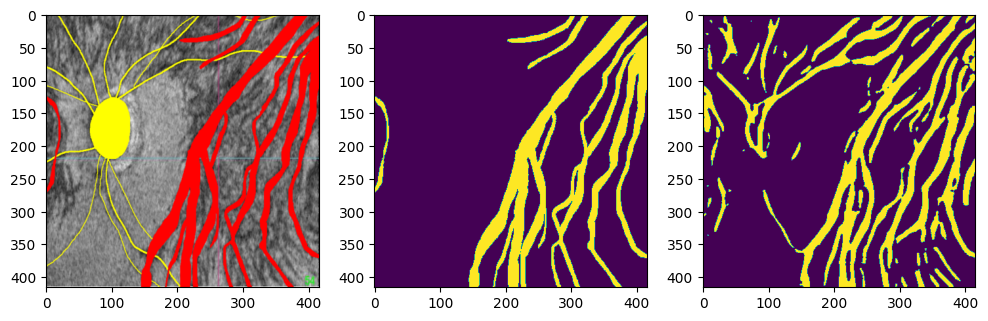

100%|██████████| 42/42 [01:07<00:00,  1.61s/it, Epoch=145, Loss=0.523005, Mean Loss=0.459842, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.41602180375069814 0.5875923699038494 0.6709406408328779 0.5226639223569034 0.9143941519866239


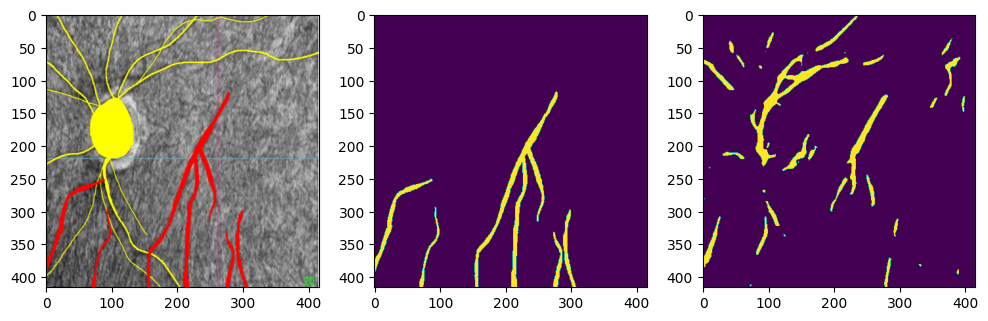

100%|██████████| 42/42 [01:06<00:00,  1.59s/it, Epoch=150, Loss=0.498270, Mean Loss=0.458217, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.4079718938464193 0.5795170992112441 0.6372717003324434 0.5313609663600727 0.9159426859790399


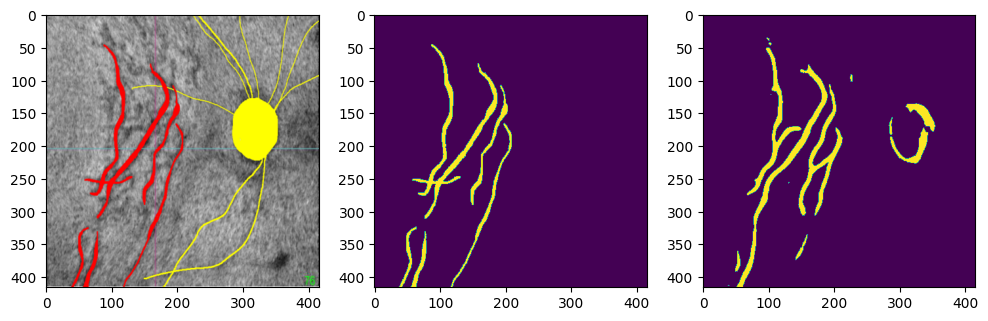

100%|██████████| 42/42 [01:07<00:00,  1.60s/it, Epoch=155, Loss=0.485090, Mean Loss=0.455336, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.4121872858225017 0.5837572536739432 0.6138917800300424 0.5564427664053838 0.9204253023689474


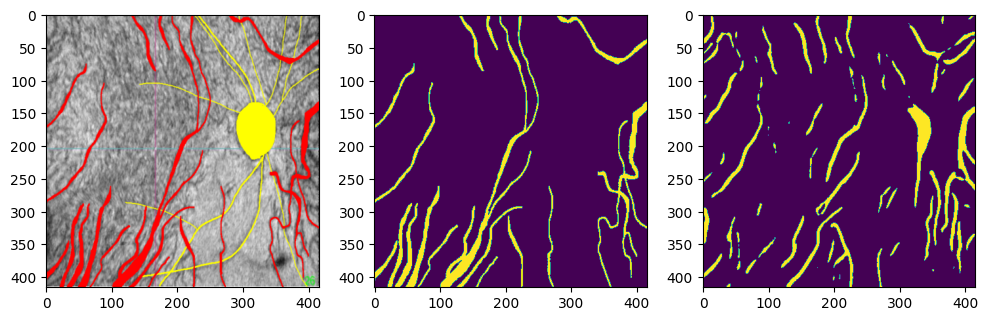

100%|██████████| 42/42 [01:07<00:00,  1.60s/it, Epoch=160, Loss=0.456414, Mean Loss=0.452981, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.4158429287181375 0.5874139288806979 0.638303199006896 0.5440398825271409 0.9184984002573131


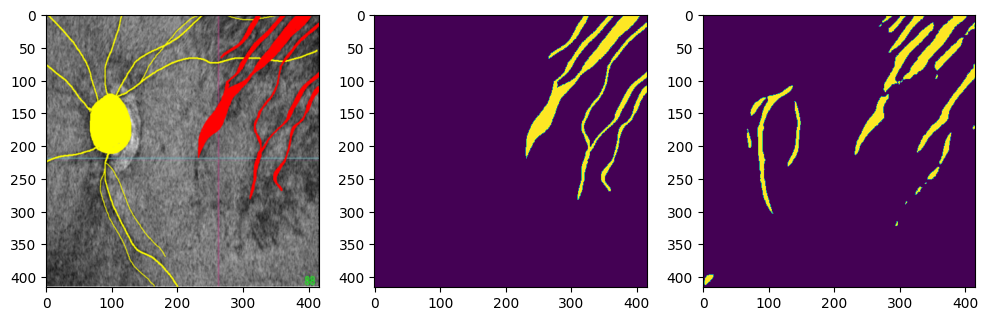

100%|██████████| 42/42 [01:08<00:00,  1.64s/it, Epoch=165, Loss=0.519122, Mean Loss=0.452557, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.413514225740961 0.5850867549977401 0.6409756043400306 0.5381625284434248 0.9173681791190933


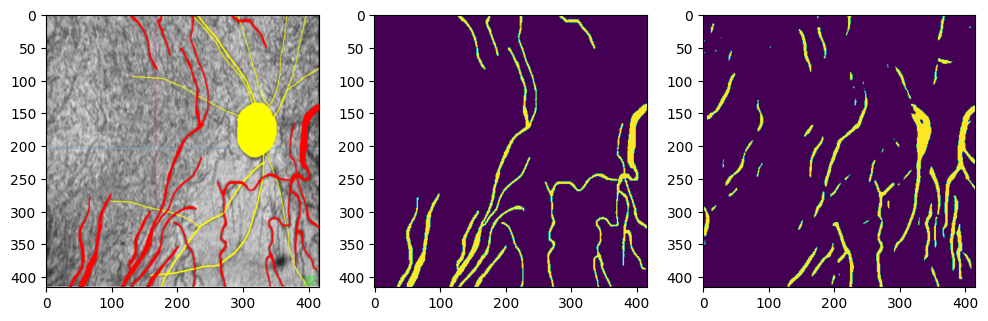

100%|██████████| 42/42 [01:08<00:00,  1.63s/it, Epoch=170, Loss=0.429569, Mean Loss=0.448019, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.4185441226402262 0.5901037774718244 0.6607073144000797 0.5331329096547279 0.9165697727414784
Model Saved


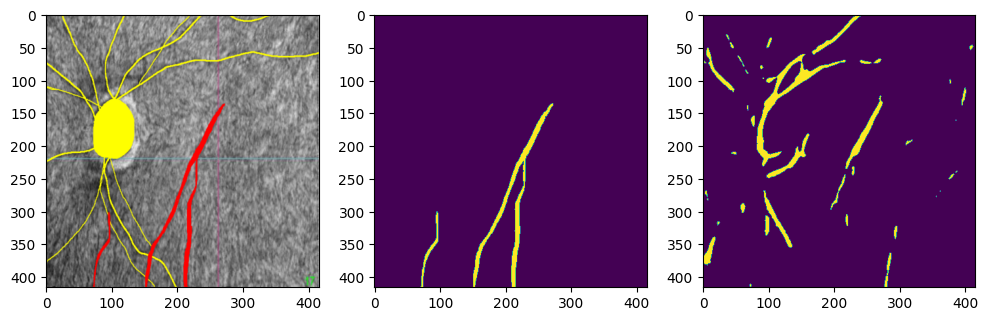

100%|██████████| 42/42 [01:07<00:00,  1.60s/it, Epoch=175, Loss=0.457909, Mean Loss=0.448253, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.41056875607636106 0.5821322134177981 0.6351789757647954 0.5372628813517988 0.9171138122187266


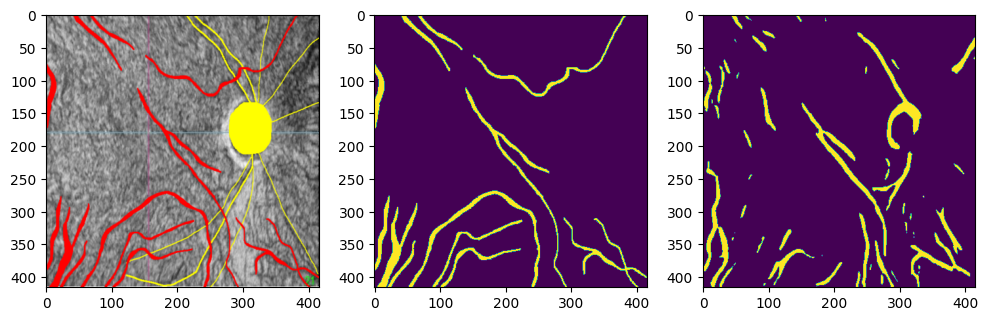

100%|██████████| 42/42 [01:08<00:00,  1.63s/it, Epoch=180, Loss=0.440330, Mean Loss=0.447218, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.4175585854366368 0.5891235674157628 0.6424537276141508 0.5439686640366357 0.9185454256604717


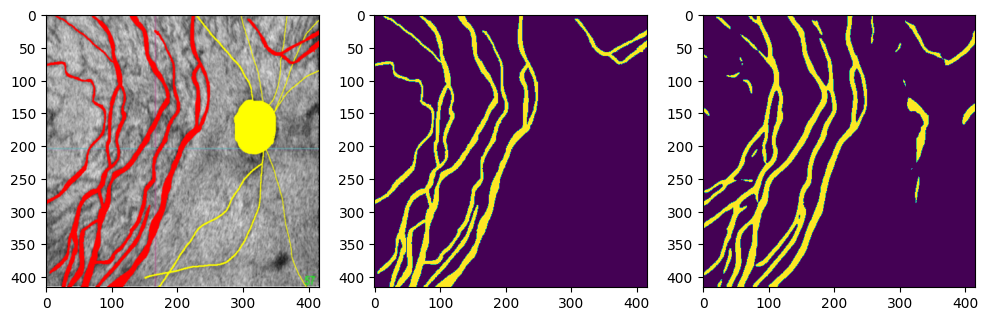

100%|██████████| 42/42 [01:08<00:00,  1.64s/it, Epoch=185, Loss=0.501797, Mean Loss=0.447530, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.42052542874676785 0.5920702582814988 0.6249782418248357 0.5624544408882662 0.921720901872031
Model Saved


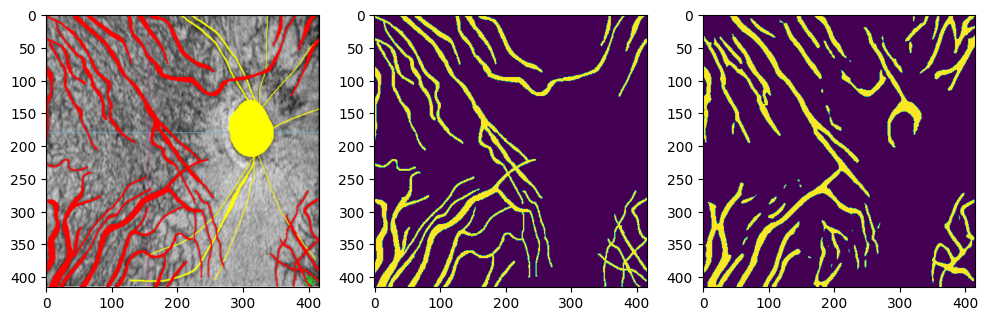

100%|██████████| 42/42 [01:08<00:00,  1.62s/it, Epoch=190, Loss=0.476116, Mean Loss=0.445481, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.4148607401777383 0.5864333194030424 0.634770495126527 0.5449368882843305 0.9186209853425286


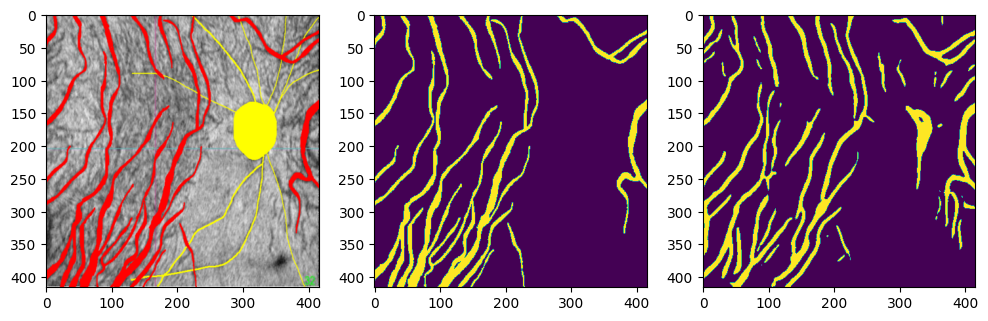

100%|██████████| 42/42 [01:07<00:00,  1.60s/it, Epoch=195, Loss=0.487826, Mean Loss=0.443526, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.42074211607968726 0.5922849915094492 0.6458811326715028 0.5469022590024603 0.9191746935942579
Model Saved


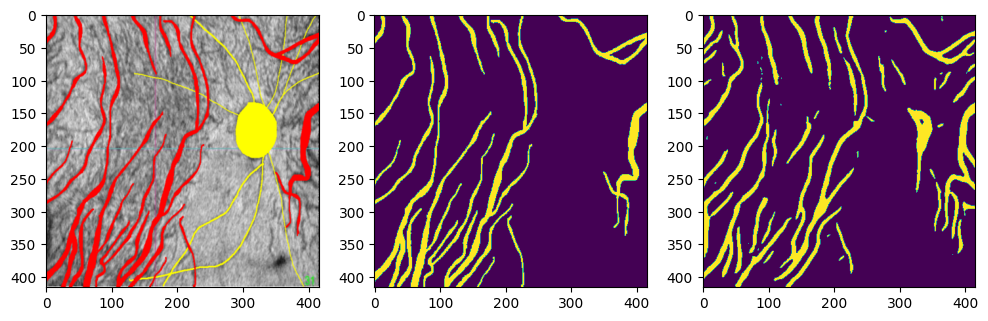

100%|██████████| 42/42 [01:06<00:00,  1.59s/it, Epoch=200, Loss=0.460109, Mean Loss=0.443688, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.4136455312468127 0.5852181782543238 0.6282301488438261 0.5477184648978867 0.9190551035502958


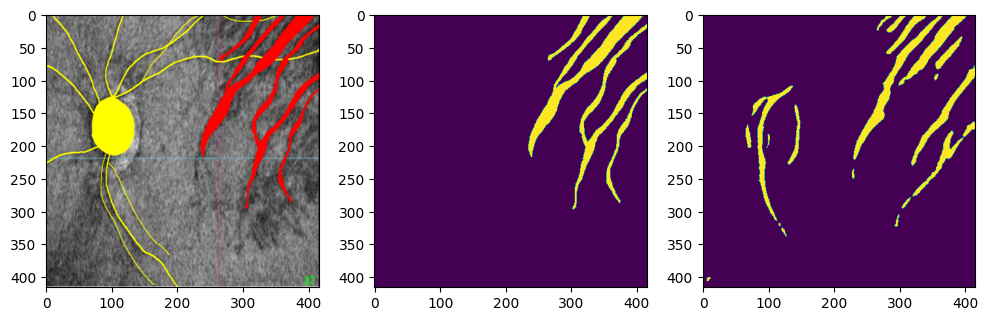

100%|██████████| 42/42 [01:07<00:00,  1.60s/it, Epoch=205, Loss=0.470765, Mean Loss=0.441570, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.4011630696696856 0.5726143920768011 0.6048663457082134 0.5436277300376122 0.9179297330767148


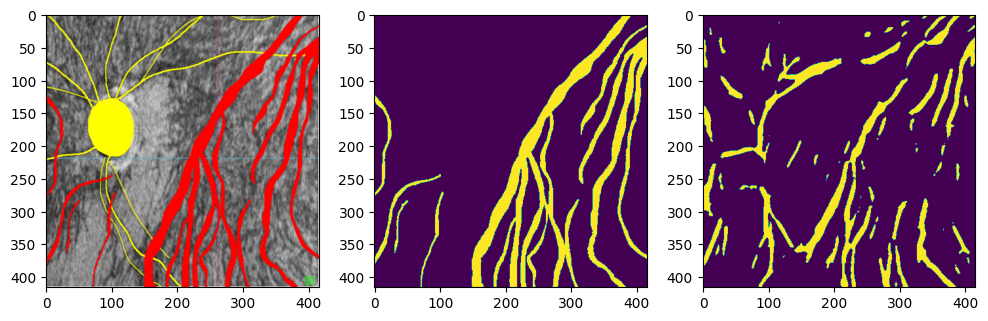

100%|██████████| 42/42 [01:06<00:00,  1.58s/it, Epoch=210, Loss=0.421493, Mean Loss=0.439623, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.4083827173328653 0.5799314523061501 0.6070847841768103 0.5551031255495723 0.920060460767564


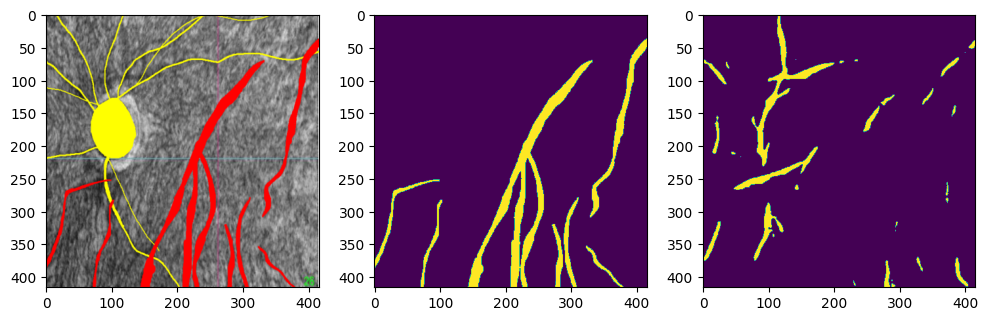

100%|██████████| 42/42 [01:07<00:00,  1.61s/it, Epoch=215, Loss=0.420324, Mean Loss=0.438593, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.40075533798248236 0.5721989088539802 0.5991155615185093 0.5475968533435557 0.9185719089872073


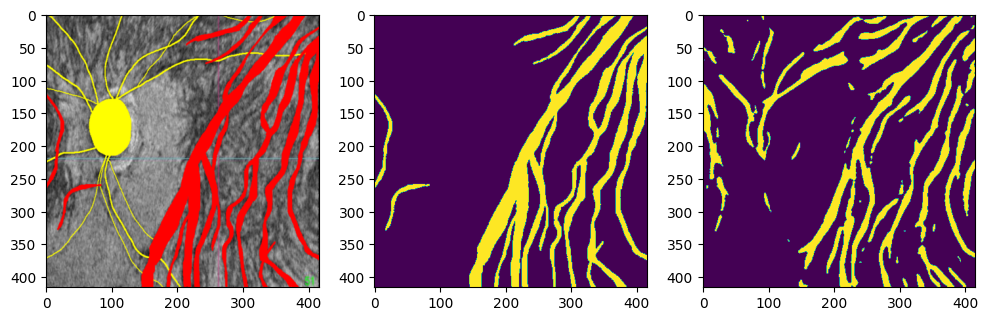

100%|██████████| 42/42 [01:07<00:00,  1.61s/it, Epoch=220, Loss=0.365596, Mean Loss=0.436876, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.4020053846896263 0.573471955357178 0.5728592641832858 0.5740859585196161 0.9225445219393282


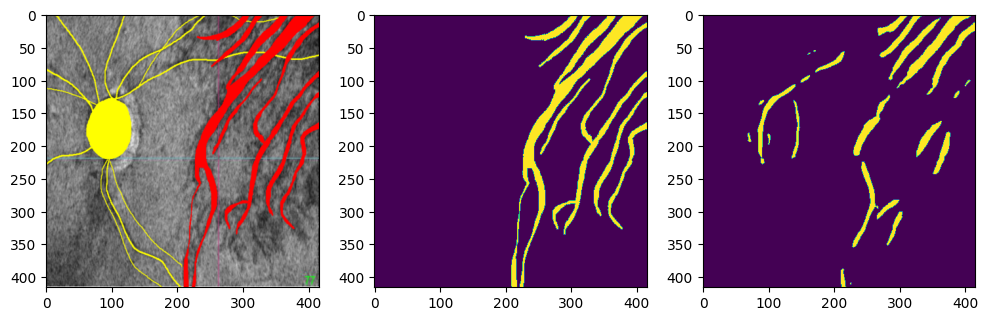

100%|██████████| 42/42 [01:06<00:00,  1.59s/it, Epoch=225, Loss=0.365812, Mean Loss=0.436235, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.41467934347549834 0.5862520653715623 0.6619841521689767 0.5260689082784116 0.915068687364572


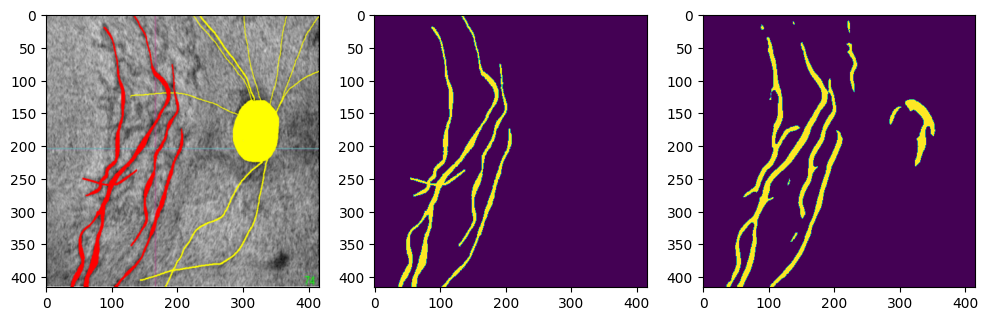

100%|██████████| 42/42 [01:08<00:00,  1.63s/it, Epoch=230, Loss=0.437700, Mean Loss=0.435704, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.4106763815071654 0.5822403875060262 0.6015825625149084 0.5641032530164385 0.9215328002593967


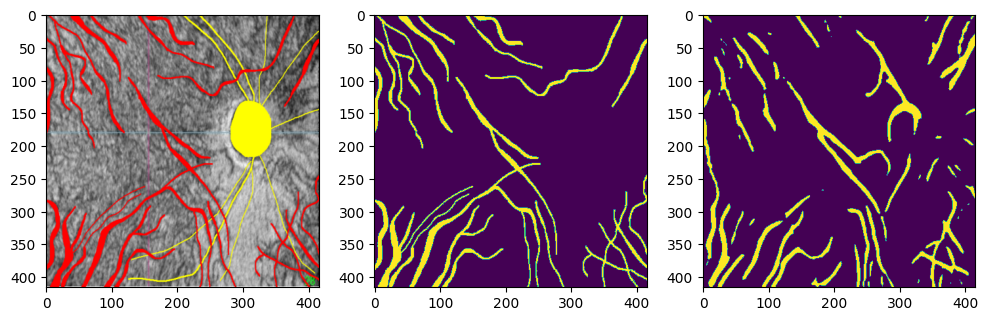

100%|██████████| 42/42 [01:06<00:00,  1.59s/it, Epoch=235, Loss=0.484480, Mean Loss=0.436682, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.4089982829500589 0.5805518543198332 0.5882751551366843 0.5730287197111719 0.9227343326787649


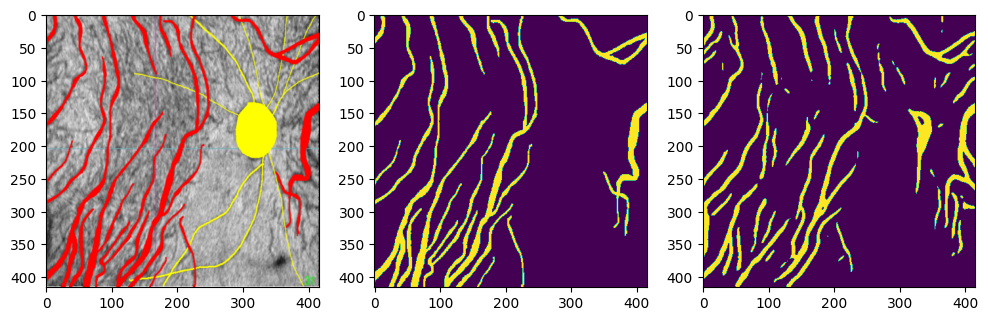

100%|██████████| 42/42 [01:03<00:00,  1.52s/it, Epoch=240, Loss=0.431705, Mean Loss=0.435106, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.4093923141736487 0.5809486969051375 0.6136065061778891 0.5515914953899154 0.9195384934421619


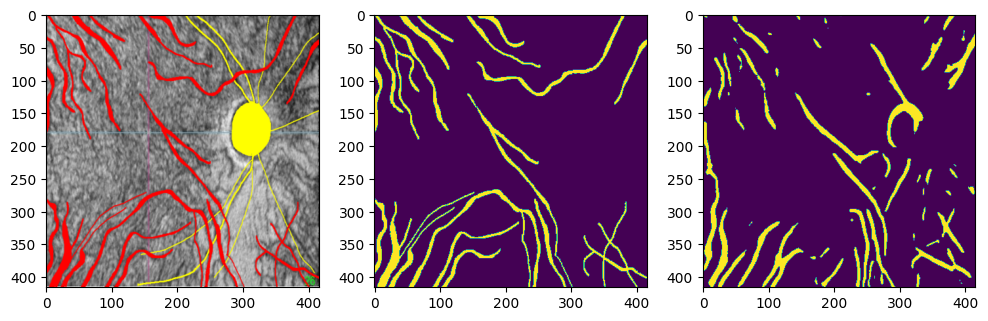

100%|██████████| 42/42 [01:08<00:00,  1.64s/it, Epoch=245, Loss=0.485962, Mean Loss=0.434161, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.41336189405211593 0.5849342561047902 0.6233192481234245 0.5510026362209766 0.9195938691505542


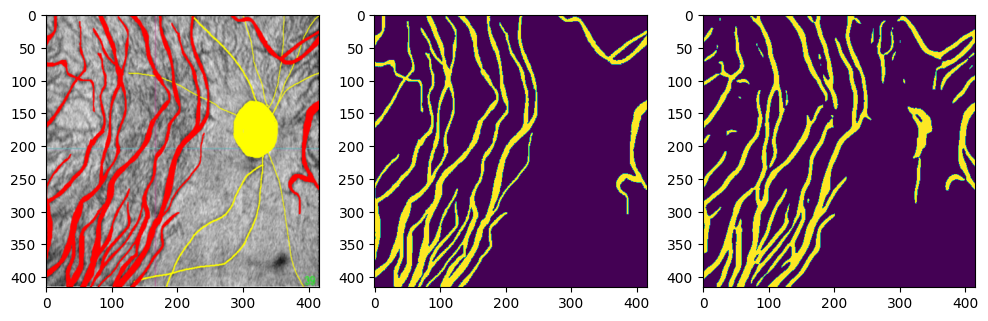

100%|██████████| 42/42 [01:07<00:00,  1.62s/it, Epoch=250, Loss=0.465321, Mean Loss=0.432961, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.4045695314368794 0.5760761890128763 0.5666849566663109 0.5857839339672046 0.9241914202485624


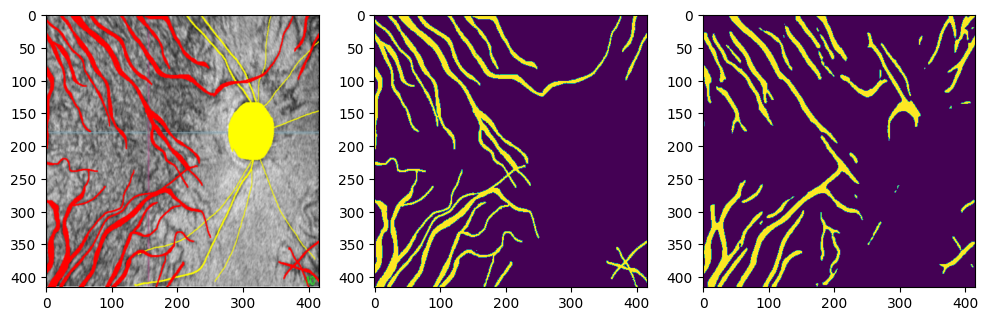

100%|██████████| 42/42 [01:03<00:00,  1.51s/it, Epoch=255, Loss=0.494064, Mean Loss=0.432983, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.4055474395522621 0.5770668824688684 0.5800057950168586 0.5741576029438825 0.9227236384282024


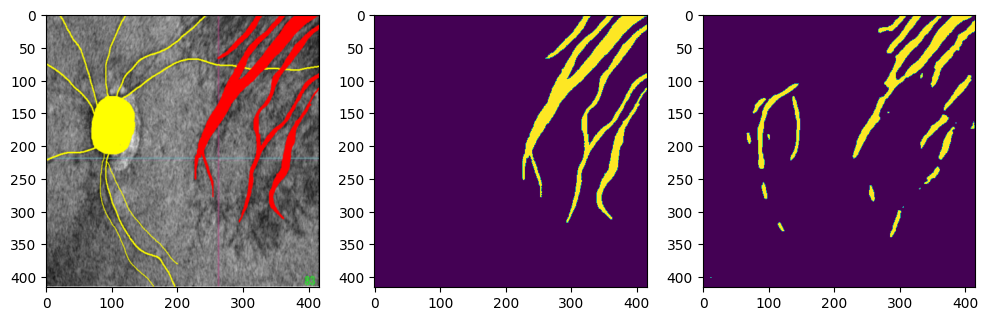

100%|██████████| 42/42 [01:06<00:00,  1.58s/it, Epoch=260, Loss=0.449814, Mean Loss=0.431633, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.4164162104062892 0.5879856603545127 0.6087360774540893 0.568603278355075 0.9224568518730728


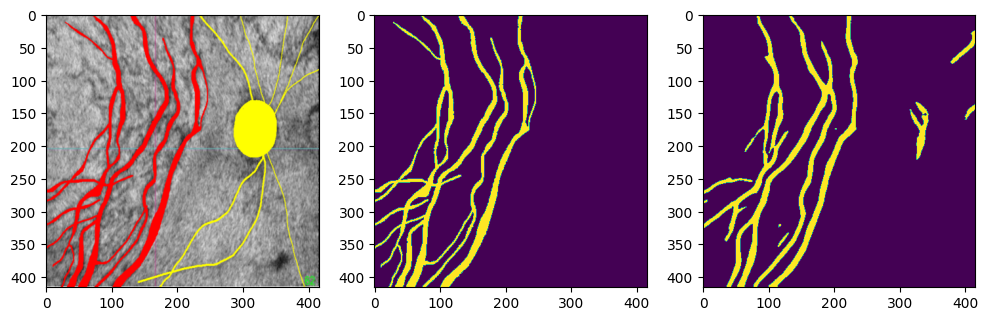

100%|██████████| 42/42 [01:07<00:00,  1.60s/it, Epoch=265, Loss=0.467955, Mean Loss=0.431389, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.40616022986926903 0.5776869822396127 0.6047148443404031 0.5529717873759463 0.919636043889074


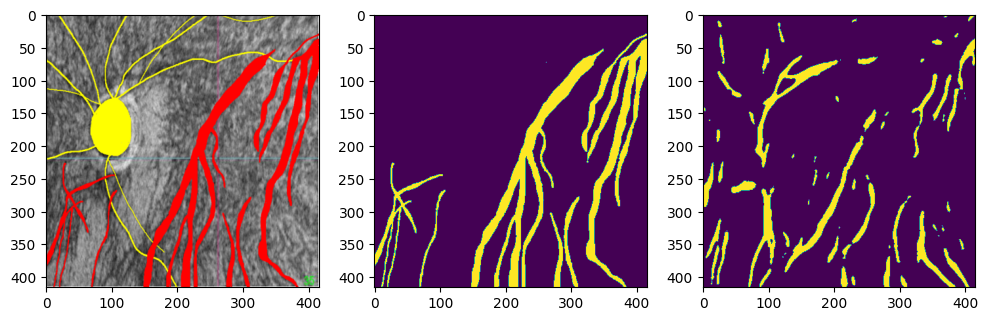

100%|██████████| 42/42 [01:05<00:00,  1.55s/it, Epoch=270, Loss=0.415482, Mean Loss=0.429887, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.4141908097908238 0.5857636846785728 0.6168594876746654 0.5576524979913333 0.9206986161607217


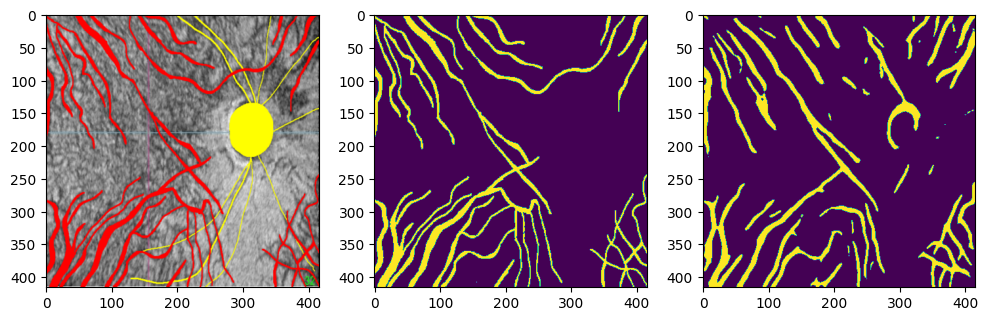

100%|██████████| 42/42 [01:07<00:00,  1.61s/it, Epoch=275, Loss=0.497680, Mean Loss=0.431110, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.4106663437392871 0.5822302992651317 0.6176182480711333 0.5506778635880561 0.9194378502896075


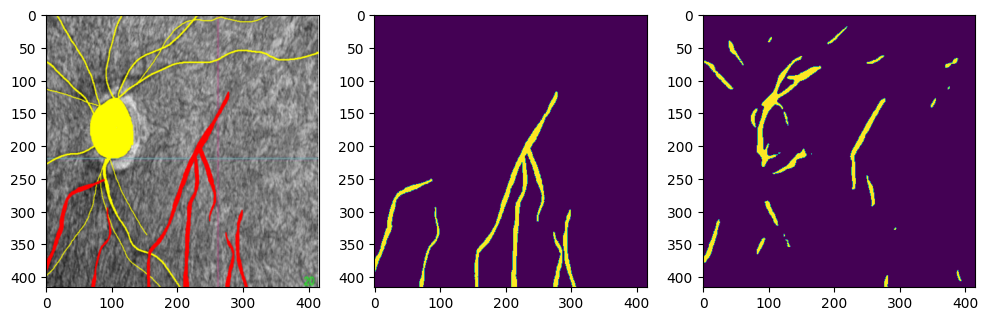

100%|██████████| 42/42 [01:08<00:00,  1.62s/it, Epoch=280, Loss=0.421268, Mean Loss=0.428833, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.4094521071766677 0.5810088971335937 0.5808211445767166 0.5811967711131208 0.9238564313953246


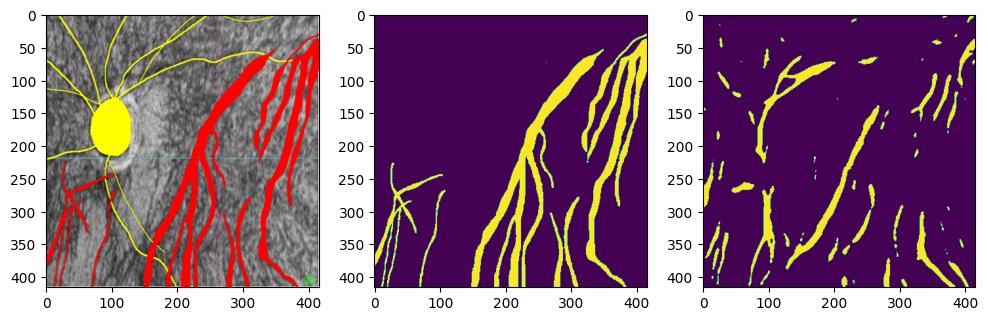

100%|██████████| 42/42 [01:05<00:00,  1.56s/it, Epoch=285, Loss=0.497172, Mean Loss=0.428810, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.40785533238554916 0.5793994922680816 0.6045293178427065 0.5562755396804943 0.9202229743103592


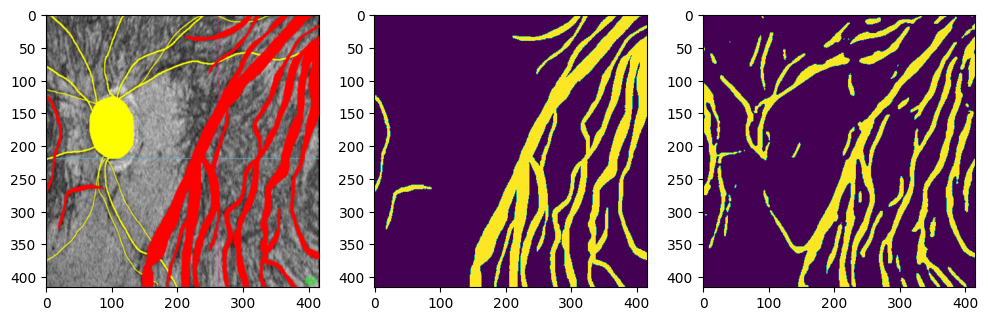

100%|██████████| 42/42 [01:06<00:00,  1.58s/it, Epoch=290, Loss=0.406273, Mean Loss=0.427028, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.4071471910486999 0.5786845806020715 0.62103007320059 0.5417451983152921 0.9178047226591799


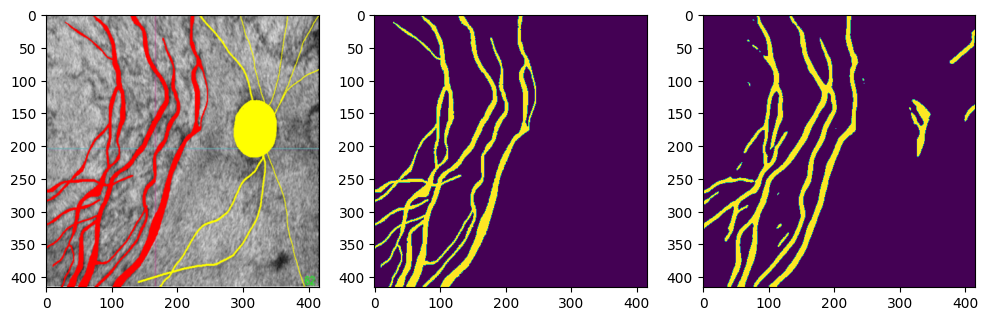

100%|██████████| 42/42 [01:07<00:00,  1.60s/it, Epoch=295, Loss=0.424144, Mean Loss=0.426039, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.40389295668468805 0.575389960839303 0.5844872627821668 0.5665715101589481 0.9215899339267856


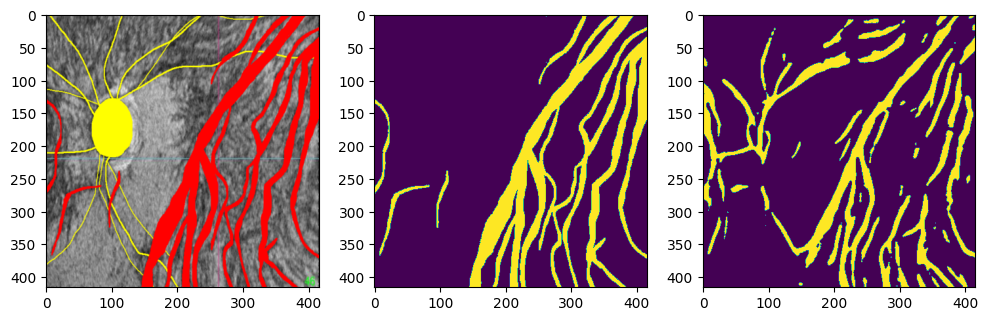

100%|██████████| 42/42 [01:03<00:00,  1.52s/it, Epoch=299, Loss=0.422169, Mean Loss=0.425423, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.40474542150695514 0.576254480434982 0.5613874230226206 0.5919303984498413 0.9249549116072173


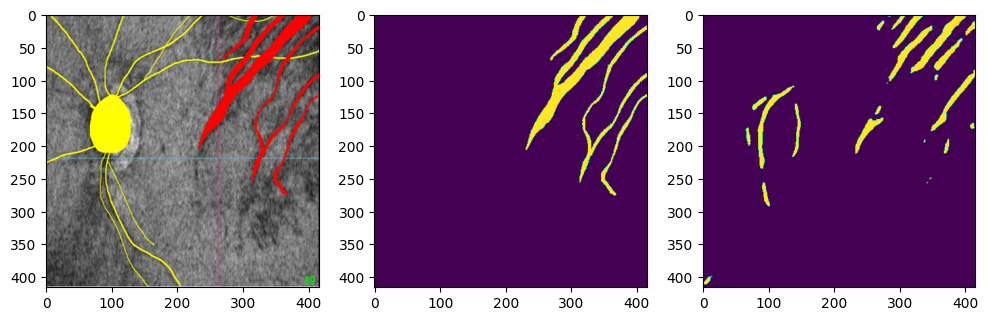

In [24]:
from typing import DefaultDict
from sklearn.exceptions import DataDimensionalityWarning
from tensorboardX import SummaryWriter
import datetime 

exp = 'SA-UNet_2lb_base'

num_epochs = args['epoch_num']
resume_epochs = args['last_epoch']
load_from = '../model/vessel_PFNet_base_b32_e500_220921_00:30.pt'


batch_size = args['train_batch_size']
scaler = torch.cuda.amp.GradScaler()
now = datetime.datetime.now()
log_name = f'{exp}_b{batch_size}_e{num_epochs}_js_'+now.strftime("%y%m%d_%H:%M")
writer = SummaryWriter(log_dir='./ckpt/PFNet/log/'+ log_name)
save_path = f'../model/vessel_{exp}_b{batch_size}_e{num_epochs}_'+ now.strftime("%y%m%d_%H:%M") + '.pt'

if torch.cuda.device_count() > 1:
    print(f'Using {torch.cuda.device_count()} GPUs.')
    net = nn.DataParallel(net)

# net.float()
net = net.to(device)
train_loss_list = []
test_acc_list = []
test_recall_list = []
test_f1_list = []
print(log_name)
print(save_path)
print(f'Training {num_epochs} epochs.')
if resume_epochs != 0:
    print(f'Resuming from epoch {resume_epochs}')
    net.load_state_dict(torch.load(load_from))
if args['amp'] == True:
    print("Using mixed precision.")

# print(data.shape, aug_masks[0].shape, aug_masks[1].shape, aft_mask.shape)
curr_iter = 1

for epoch in range(args['last_epoch'], args['last_epoch'] + args['epoch_num']):
    
    net.train()

    loss_running = 0
    tqdm_dataset = tqdm(train_loader)
    for batch_idx, batch in enumerate(tqdm_dataset):
        if args['poly_train']:
            base_lr = args['lr'] * (1 - float(curr_iter) / float(num_epochs)) ** args['lr_decay']
            optimizer.param_groups[0]['lr'] = 2 * base_lr
            optimizer.param_groups[1]['lr'] = 1 * base_lr
        # label: ([32, 2, 416, 416])
        image, [labels, mask_o], _ = batch
        label_r, label_y =  labels[:, 0].float().to(device), labels[:, 1].float().to(device)
        label_r, label_y = label_r.unsqueeze(1), label_y.unsqueeze(1)
        image = image.float().to(device)
        optimizer.zero_grad()

        pred = net(image)

        loss_r = dice_loss(pred, label_r)
        loss_y = dice_loss(pred, label_y)
        
        loss = loss_r + 0.1*loss_y
        # loss = loss_r
        
        loss.backward()
        # nn.utils.clip_grad_norm_(net.parameters(), max_norm=10)
        optimizer.step()
        
        loss_running += loss.item()
        
        tqdm_dataset.set_postfix({
            'Epoch': epoch,
            'Loss': '{:06f}'.format(loss.item()),
            'Mean Loss' : '{:06f}'.format(loss_running/(batch_idx+1)),
            'lr' : '{:06f}'.format(optimizer.param_groups[0]["lr"])
        })

        curr_iter += 1

    epoch_loss = loss_running / len(train_loader)

    writer.add_scalar('loss/Train', epoch_loss, epoch)
    writer.add_scalar('learning_rate', optimizer.param_groups[0]["lr"], epoch)
    train_loss_list.append(epoch_loss)

## EVAL
    if epoch % 5 == 0 or epoch == args['epoch_num']-1 :
        print("Testing...")

        images=[]
        preds=[]
        labels=[]
        label_os = []
        net.eval()
        # tqdm_loader = tqdm(test_loader)
        with torch.no_grad():
            for idx, dd in enumerate(test_loader):

                image, [label, label_o], _ = dd
                
                image = image.float().to(device)
            
                label = label[:, 0].float()

                label_o = label_o.float()

                pred = net(image)

                images.append(image.cpu().detach().numpy())
                labels.append(label.numpy())
                label_os.append(label_o)
                preds.append(pred.cpu().detach().numpy())

            images= np.array(images)#.squeeze(1)
            preds = np.array(preds).squeeze(1)
            labels = np.array(labels)
            label_os = np.array(label_os)
            preds = np.where(preds > 0.5 , 1 , 0)
            labels = np.where(labels > 0.5 , 1 , 0)
            
            score_jaccard, score_f1, score_recall, score_precision, score_acc = calc_metric(labels=labels, preds=preds)
            test_acc_list.append(score_acc)
            test_recall_list.append(score_recall)
            test_f1_list.append(score_f1)
            writer.add_scalar('Accuracy/Test', score_acc, epoch)
            writer.add_scalar('F1/Test', score_f1, epoch)
            writer.add_scalar('Recall/Test', score_recall, epoch)
            writer.add_scalar('Precision/Test', score_precision, epoch)
            writer.add_scalar('Jaccard/Test', score_jaccard, epoch)

            if np.max(test_f1_list) == test_f1_list[-1] or np.max(test_recall_list) == test_recall_list[-1]:
                torch.save(net.state_dict(), save_path)
                print("Model Saved")

            randnum = np.random.randint(0, 171)
            plt.figure(figsize=(10, 4))
            plt.subplot(1, 3, 1)  
            plt.imshow(label_os[randnum][0])
            plt.subplot(1, 3, 2)  
            plt.imshow(labels[randnum][0])
            plt.subplot(1, 3, 3)
            plt.imshow(preds[randnum][0])
            plt.tight_layout()
            plt.show()

# evaluation

In [13]:
print("Testing...")
net = SA_UNet(in_channels=3, num_classes=1 , base_c=16)
load_from = '/home/sklab2/workspace/code_only/junsu/model/vessel_SA-UNet_2lb_base_b32_e300_221002_12:16.pt'
if torch.cuda.device_count() > 1:
    print(f'Using {torch.cuda.device_count()} GPUs.')
net = nn.DataParallel(net)
net.load_state_dict(torch.load(load_from))
net.to(device)

images=[]
preds=[]
labels=[]
label_os = []
net.eval()
# tqdm_loader = tqdm(test_loader)
with torch.no_grad():
    for idx, dd in enumerate(tqdm(test_loader)):

        image, [label, label_o], _ = dd
        
        image = image.float().to(device)
    
        label = label[:, 0].float()

        label_o = label_o.float()

        pred = net(image) 

        images.append(image.cpu().detach().numpy())
        labels.append(label.numpy())
        label_os.append(label_o)
        preds.append(pred.cpu().detach().numpy())

    images= np.array(images).squeeze(1)
    preds = np.array(preds).squeeze(1)
    labels = np.array(labels)
    label_os = np.array(label_os)
    preds = np.where(preds > 0.5 , 1 , 0)
    labels = np.where(labels > 0.5 , 1 , 0)
    
    score_jaccard, score_f1, score_recall, score_precision, score_acc = calc_metric(labels=labels, preds=preds)

Testing...
Using 2 GPUs.


100%|██████████| 355/355 [00:20<00:00, 17.48it/s]


jaccard, f1, recall, precision, acc
0.42074211607968726 0.5922849915094492 0.6458811326715028 0.5469022590024603 0.9191746935942579


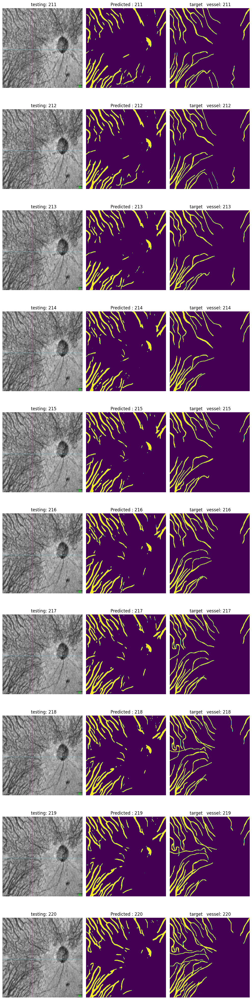

In [14]:
# randnum = np.random.randint(0, len(test_dataset)-10)
randnum=211

fig, axes = plt.subplots(10, 3, figsize = (10,40))
[c_ax.axis('off') for c_ax in axes.flatten()]

for idx, (img_ax, target_ax , mask_ax ) in zip(range(randnum, randnum+10), axes):
    
# inputs[:10] , preds[:10], targets[:10], urls_list[:10]) :
    
    image = images[idx].astype(int).transpose(1, 2, 0) # astype(int)
    img_target = preds[idx].transpose(1, 2, 0) 
    img_mask = labels[idx].transpose(1, 2, 0)  
 
    img_ax.imshow(np.clip(image, 0, 255))

    target_ax.imshow(img_target )
    mask_ax.imshow(img_mask)

    img_ax.set_title(f'  testing: {idx}')
    target_ax.set_title(f' Predicted : {idx}')
    
    mask_ax.set_title(f' target   vessel: {idx}')
plt.tight_layout()
plt.show()
 